## LOAD PACKAGE

In [1]:
#| export

# import kagglehub
# !pip install peft

import os
import io
import re
import random
import base64
from io import BytesIO

import time
from datetime import timedelta

import numpy as np

import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F

from IPython.display import SVG

from PIL import Image
import PIL


import cv2


from diffusers import StableDiffusionPipeline
from transformers import AutoProcessor, AutoModel
import metric


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


RuntimeError: Failed to import transformers.models.timm_wrapper.configuration_timm_wrapper because of the following error (look up to see its traceback):
cannot import name 'ImageNetInfo' from 'timm.data' (c:\Users\YongsanHuang\.conda\envs\sd\Lib\site-packages\timm\data\__init__.py)

## Competition Metric Helpers

We also want to evaluate metrics of the original bitmap before converting to svg. Let’s implement it using [metric package](https://www.kaggle.com/code/jiazhuang/svg-image-fidelity).

In [ ]:
import numpy as np
import statistics
import pandas as pd

def image_resize(image, size=(384, 384)):
    return image.convert('RGB').resize(size)

def bitmap_score_instance_impl(multiple_choice_qa, image, random_seed=42):
    rng = np.random.RandomState(random_seed)
    group_seed = rng.randint(0, np.iinfo(np.int32).max)
    image_processor = metric.ImageProcessor(image=image_resize(image), seed=group_seed).apply()
    image = image_processor.image.copy()
    questions = multiple_choice_qa['question']
    choices = multiple_choice_qa['choices']
    answers = multiple_choice_qa['answer']
    aesthetic_score = metric.aesthetic_evaluator.score(image)
    vqa_score = metric.vqa_evaluator.score(questions, choices, answers, image)
    image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
    ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    instance_score = metric.harmonic_mean(vqa_score, aesthetic_score, beta=0.5) * ocr_score
    return instance_score, vqa_score, ocr_score, aesthetic_score

def bitmap_score_instance(multiple_choice_qa, image, random_seed=42):
    is_single = not isinstance(image, list)
    if is_single:
        multiple_choice_qa = [multiple_choice_qa]
        image = [image]
    
    assert len(multiple_choice_qa) == len(image)

    results = []
    score_df = []
    for one_image, one_multiple_choice_qa in zip(image, multiple_choice_qa, strict=True):
        instance_score, vqa_score, ocr_score, aesthetic_score = bitmap_score_instance_impl(one_multiple_choice_qa, one_image, random_seed=42)
        results.append(instance_score)
        score_df.append([instance_score, vqa_score, ocr_score, aesthetic_score])

    fidelity = statistics.mean(results)
    score_df = pd.DataFrame(score_df, columns=['competition_score', 'vqa_score', 'ocr_score', 'aesthetic_score'])
    if is_single:
        return score_df.iloc[0].to_dict()
    else:
        return float(fidelity), score_df

## Refiner

In [1]:
import torch
from transformers import T5EncoderModel
from PIL import Image as PILImage

from diffusers import BitsAndBytesConfig, SD3Transformer2DModel
from diffusers import StableDiffusion3Pipeline
from diffusers import DiffusionPipeline


sd3_path = "stable-diffusion-3.5-large-turbo"
sdxl_refiner_path = 'stable-diffusion-xl-pytorch-refiner-1-0-v1'

nf4_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.bfloat16
)
model_nf4 = SD3Transformer2DModel.from_pretrained(
    sd3_path,
    subfolder="transformer",
    quantization_config=nf4_config,
    torch_dtype=torch.bfloat16
)

t5_nf4 = T5EncoderModel.from_pretrained("t5-nf4", torch_dtype=torch.bfloat16)

base = StableDiffusion3Pipeline.from_pretrained(
    sd3_path, 
    transformer=model_nf4,
    text_encoder_3=t5_nf4,
    torch_dtype=torch.bfloat16
)
base = base.to("cuda:0")


# refiner = DiffusionPipeline.from_pretrained(
#     sdxl_refiner_path,
#     text_encoder_2=base.text_encoder_2,
#     vae=base.vae,
#     torch_dtype=torch.float16,
#     use_safetensors=True,
#     variant="fp16",
# )
# refiner.to("cuda:0")
# refiner.unet = torch.compile(refiner.unet, mode="reduce-overhead", backend="eager", fullgraph=True)




Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


In [2]:
base

StableDiffusion3Pipeline {
  "_class_name": "StableDiffusion3Pipeline",
  "_diffusers_version": "0.33.1",
  "_name_or_path": "stable-diffusion-3.5-large-turbo",
  "feature_extractor": [
    null,
    null
  ],
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "FlowMatchEulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "text_encoder_3": [
    "transformers",
    "T5EncoderModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_3": [
    "transformers",
    "T5TokenizerFast"
  ],
  "transformer": [
    "diffusers",
    "SD3Transformer2DModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [4]:
from diffusers.utils import numpy_to_pil

def generate_bitmap(prompt, negative_prompt=""):
    
    # run both experts
    image = base(
        prompt=prompt,
        negative_prompt=negative_prompt,
        width=512,
        height=512,
        num_inference_steps=4,
        # denoising_end=high_noise_frac,
        guidance_scale=0,
        # output_type="latent",
    ).images[0]

    # image = refiner(
    #     prompt=prompt,
    #     negative_prompt=negative_prompt,
    #     width=512,
    #     height=512,
    #     num_inference_steps=10,
    #     denoising_start=0.8,
    #     guidance_scale=20,
    #     image=image,
    # ).images[0]
    
    return image

## Warm-up for torch.compile()

  0%|          | 0/4 [00:00<?, ?it/s]

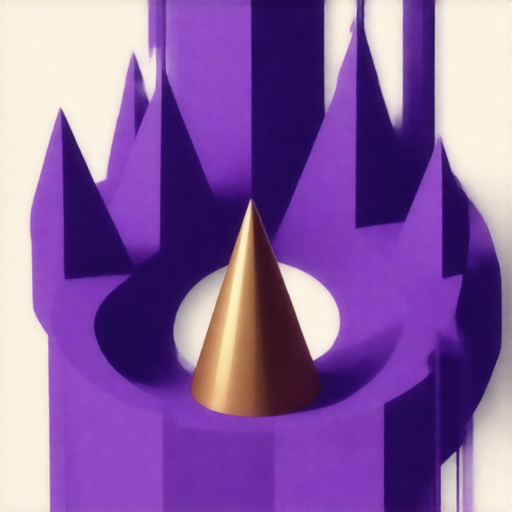

(512, 512)


In [14]:
#| export
# triiger the compilation first
from IPython.display import display
description = 'flat 2d sticker design of purple pyramids spiraling around a bronze cone'
img = generate_bitmap(prompt = description, negative_prompt = '')
display(img)
print(img.size)

## Load Data

In [ ]:
import pandas as pd
import json

In [ ]:
train_df = pd.read_csv('train.csv')
train_question_df = pd.read_parquet('questions.parquet')

In [ ]:
train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))
train_question_df = train_question_df.reset_index(name='qa')

train_question_df['question'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['question'], ensure_ascii=False))

train_question_df['choices'] = train_question_df.qa.apply(
    lambda qa: json.dumps(
        [x.tolist() for x in qa['choices']], ensure_ascii=False
    )
)

train_question_df['answer'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['answer'], ensure_ascii=False))

train_df = pd.merge(train_df, train_question_df, how='left', on='id')

train_df['multiple_choice_qa'] = train_df.apply(
    lambda r: {
    'question': json.loads(r.question),
    'choices': json.loads(r.choices),
    'answer': json.loads(r.answer)
    },
    axis=1,
)

train_df.head()

C:\Users\YongsanHuang\AppData\Local\Temp\ipykernel_33976\3218796089.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))


,id,description,qa,question,choices,answer,multiple_choice_qa
0,02d892,a purple forest at dusk,"{'id': ['02d892', '02d892', '02d892', '02d892'...","[""What is the main setting of the image?"", ""Is...","[[""beach"", ""desert"", ""forest"", ""mountain""], [""...","[""forest"", ""yes"", ""dusk"", ""purple""]",{'question': ['What is the main setting of the...
1,0dcd2e,gray wool coat with a faux fur collar,"{'id': ['0dcd2e', '0dcd2e', '0dcd2e', '0dcd2e'...","[""What color is the coat?"", ""What part of the ...","[[""blue"", ""brown"", ""gray"", ""red""], [""collar"", ...","[""gray"", ""collar"", ""no"", ""wool""]","{'question': ['What color is the coat?', 'What..."
2,1e9ac1,a lighthouse overlooking the ocean,"{'id': ['1e9ac1', '1e9ac1', '1e9ac1', '1e9ac1'...","[""Is there an ocean visible in the image?"", ""W...","[[""no"", ""yes""], [""inside"", ""next to"", ""overloo...","[""yes"", ""overlooking"", ""no"", ""no""]",{'question': ['Is there an ocean visible in th...
3,2b25db,burgundy corduroy pants with patch pockets and...,"{'id': ['2b25db', '2b25db', '2b25db', '2b25db'...","[""Are the pants yellow?"", ""Do the pants have p...","[[""no"", ""yes""], [""no"", ""yes""], [""no"", ""yes""], ...","[""no"", ""yes"", ""yes"", ""pants""]","{'question': ['Are the pants yellow?', 'Do the..."
4,4e6a54,orange corduroy overalls,"{'id': ['4e6a54', '4e6a54', '4e6a54', '4e6a54'...","[""What material is the item?"", ""Is a hat depic...","[[""corduroy"", ""denim"", ""leather"", ""silk""], [""n...","[""corduroy"", ""no"", ""yes"", ""overalls""]","{'question': ['What material is the item?', 'I..."


# FUNCTION img -> svg

In [ ]:
import re
import vtracer
from IPython.display import SVG, display, Image
from PIL import Image as PILImage
input_path = "output.png"
output_path = "output.svg"

In [ ]:
def convert_paths_to_polygons(svg_code: str, size: int) -> str:
    # Find all path elements
    scale_factor = 384 / size

    path_pattern = re.compile(
        r'<path[^>]*d="([^"]+)"[^>]*fill="([^"]+)"[^>]*transform="translate\(([^)]+)\)"[^>]*/?>'
    )
    paths = path_pattern.findall(svg_code)

    polygons = []

    for d_content, fill_color, translate in paths:
        tx, ty = map(float, translate.split(','))
        points = []
        tokens = re.findall(r'[MLZmlz]|-?\d+\.?\d*,\-?\d+\.?\d*', d_content.strip())
        for token in tokens:
            if token in {'M', 'L', 'Z', 'm', 'l', 'z'}:
                continue
            x_str, y_str = token.split(',')
            x = int(round(float(x_str) + tx))
            y = int(round(float(y_str) + ty))
            points.append(f"{x},{y}")

        if points:
            polygon = f'<polygon points="{" ".join(points)}" fill="{fill_color}"/>'
            polygons.append(polygon)

    # Build the compact SVG
    new_svg = (
        f'<svg width="384" height="384" viewBox="0 0 384 384"><g transform="scale({scale_factor})">'
        + "".join(polygons)
        + '</g></svg>'
    )

    return new_svg


def fix_svg_size(svg_code: str, target_size: int = 384) -> str:
    """
    Update the <svg> tag's width and height to match target size.
    """
    # Replace width attribute
    svg_code = re.sub(
        r'(width\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    # Replace height attribute
    svg_code = re.sub(
        r'(height\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    return svg_code


def bitmap_to_svg_layered(img, input_path, output_path):
    
    # Define input and output paths
    # (input_path and output_path are already passed as arguments)

    # Step 1: Resize the input image to 256x256
    # 256x256 is helpful bc each length od path is shorter, so with the same max_svg_length, we can have more paths(more color)
    size = 128
    img = img.resize((size,size), PILImage.LANCZOS)
    img.save(input_path)

    # Step 2: Convert the resized image to SVG
    layer_difference = 10  # initial value
    max_svg_length = 9996  # target length limit

    # Define injection to prevent OCR hallucination
    injection_a1 = '\n<path d="M5 374 L10 364 L15 374 M7 368 L13 368" stroke="white"/>'      # Bottom-left A
    injection_a2 = '\n<path d="M364 30 L370 20 L376 30 M367 25 L373 25" stroke="white"/>'         # Top-right A
    injection = injection_a1 + injection_a2
    injection_length = len(injection)

    while True:
        vtracer.convert_image_to_svg_py(
            input_path,
            output_path,
            colormode='color',        # Options: 'color' or 'binary'
            hierarchical='stacked',   # Options: 'stacked' or 'cutout'
            mode='polygon',           # Options: 'spline', 'polygon', or 'none'
            filter_speckle=3,          # remove tiny regions
            color_precision=8,         # reduce color complexity
            layer_difference=layer_difference,  # more aggressive merging
            corner_threshold=10,       # remove subtle corners
            length_threshold=10,       # remove short paths
            max_iterations=10,         # faster, less detail
            splice_threshold=10,       # simplify curves
            path_precision=3           # reduce vertex detail
        )

        # Step 3: Read and display the SVG
        try:
            with open(output_path, "r", encoding="utf-8") as f:
                svg_code = f.read()
        except UnicodeDecodeError:
            # Bad SVG output (probably corrupted), try again
            continue  # go back to start of while loop

        # Clean the first two lines if present
        lines = svg_code.splitlines()
        removed_length = 0
        if lines and lines[0].strip().startswith('<?xml'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        if lines and lines[0].strip().startswith('<!--'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        svg_code = "\n".join(lines)

        svg_code = svg_code.replace(
            '<svg ',
            '<svg viewBox="0 0 384 384" ', #this is 20 bytes more
            1  # only replace first occurrence
        )
        
        # remove version and xmlns attributes
        svg_code = re.sub(r'\s*version="[^"]*"', '', svg_code)
        svg_code = re.sub(r'\s*xmlns="[^"]*"', '', svg_code)

        # use polygon instead of path
        svg_code = convert_paths_to_polygons(svg_code, size)
            
        # Correct length check: give credit for removed lines
        if len(svg_code) + injection_length <= max_svg_length: # acount for injection
            break
        else:
            layer_difference += 10

    svg_code = fix_svg_size(svg_code, target_size=384) # doesnt change length

    # Inject fake letter path to prevent OCR hallucination
    svg_code = svg_code.replace("</svg>", injection + "</svg>")

    print(f'{layer_difference=}')
      

    return svg_code

# SD evaluator

In [ ]:
# | export
def get_aes_and_ocr_score(svg_content):
    image_processor = metric.ImageProcessor(image=metric.svg_to_png(svg_content), seed=42).apply()
    image = image_processor.image.copy()
    aesthetic_score = metric.aesthetic_evaluator.score(image)
    image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
    ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    return aesthetic_score, ocr_score

# from t2v_metrics import VQAScore
# from PIL import Image

# # Load the T2I model once
# vqa_scorer = VQAScore(model='clip-flant5-xxl')

# def get_aes_ocr_t2i_score(sample, prompt, aes=True, ocr=True, t2i=True):
#     # If sample is a string, treat as SVG and convert to image
#     if isinstance(sample, str):
#         image = metric.svg_to_png(sample)
#     else:
#         image = sample

#     image_processor = metric.ImageProcessor(image=image, seed=42).apply()
#     processed_image = image_processor.image.copy()

#     aesthetic_score = metric.aesthetic_evaluator.score(processed_image) if aes else 1.0

#     if ocr:
#         image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
#         ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
#     else:
#         ocr_score = 1.0

#     if t2i:
#         t2i_score = vqa_scorer(images=[processed_image], texts=[prompt])[0]
#     else:
#         t2i_score = 1.0

#     return aesthetic_score, ocr_score, t2i_score




## Implement the package Model class

In [ ]:
#| export

class Model:
    
    def __init__(self):

        self.default_svg = """<svg width="384" height="384" viewBox="0 0 384 384"><circle cx="50" cy="50" r="40" fill="red" /></svg>"""
        self.prompt_prefix = "Simple, classic image of"
        self.prompt_suffix = "with flat color blocks, beautiful, minimal details, solid colors only"
        self.negative_prompt = "text, signature, framing, hatching, background, textures, patterns, lines, outlines"
        # self.num_inference_steps = 25
        # self.guidance_scale = 20
        self.num_attempt = 3

    def gen_bitmap(self, description):
        prompt = f'{self.prompt_prefix} {description}{self.prompt_suffix}'
        bitmap = generate_bitmap(prompt = prompt, negative_prompt=self.negative_prompt)
        return bitmap

    def predict_impl(self, prompt: str) -> str:
        best_score = 0.0
        best_svg = None
        best_img = None
        print(f'======= {prompt} =======')
        for i in range(self.num_attempt):
            bitmap = self.gen_bitmap(prompt)
            # display(bitmap.resize((256, 256), PIL.Image.LANCZOS))
            svg = bitmap_to_svg_layered(bitmap, input_path, output_path)
            aesthetic_score, ocr_score = get_aes_and_ocr_score(svg)
            score = aesthetic_score * ocr_score
            print(f'{score=}')
            print('svg length:', len(svg))
            if score >= best_score:
                best_score = score
                best_svg = svg
                best_img = bitmap
                # print('update score:', best_score)
        print('final score:', best_score)
        print('=======================================================================')
        
        if best_svg is None:
            best_svg = self.default_svg

        return best_svg, best_img

    def predict(self, prompt: str) -> str:
        svg, img = self.predict_impl(prompt)
        return svg

In [ ]:
model = Model()

======= magenta trapezoids layered on a transluscent silver sheet =======


  0%|          | 0/4 [00:00<?, ?it/s]

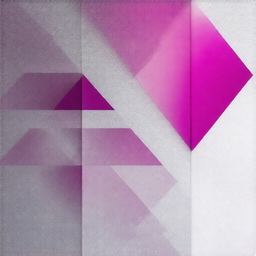

layer_difference=30
decoded text =  A
score=0.4381097316741943
svg length: 6043


  0%|          | 0/4 [00:00<?, ?it/s]

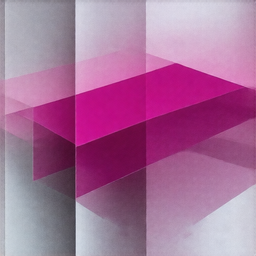

layer_difference=30
decoded text =  A
score=0.44580869674682616
svg length: 9143


  0%|          | 0/4 [00:00<?, ?it/s]

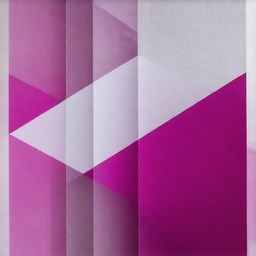

layer_difference=20
decoded text =  A
score=0.4274755954742432
svg length: 7507
final score: 0.44580869674682616


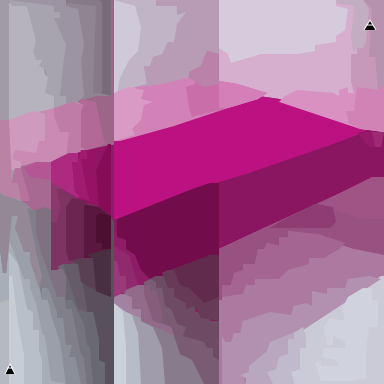

<svg width="384" height="384" viewBox="0 0 384 384"><g transform="scale(3.0)"><polygon points="0,0 128,0 128,128 0,128" fill="#8C1D66"/><polygon points="0,0 128,0 128,44 120,43 91,33 81,34 74,37 60,41 34,49 18,54 17,70 11,70 0,64" fill="#D5AFCD"/><polygon points="86,32 93,33 115,40 123,43 128,44 128,59 121,62 95,74 74,83 73,107 67,106 65,102 62,103 62,101 58,99 58,96 56,96 55,92 50,93 47,90 45,85 42,83 42,80 39,79 38,73 38,47 53,42 66,38 76,35" fill="#8A1561"/><polygon points="124,59 128,59 128,128 73,128 73,83 88,76 123,60" fill="#AC7AA1"/><polygon points="0,0 38,0 38,48 20,53 18,54 17,70 11,70 0,64" fill="#9C94A2"/><polygon points="86,32 93,33 115,40 123,43 119,45 111,48 82,58 72,61 41,73 38,73 38,47 53,42 66,38 76,35" fill="#BB1181"/><polygon points="38,0 73,0 73,27 79,28 89,31 86,33 76,36 58,42 40,47 38,47" fill="#D382B8"/><polygon points="127,92 128,92 128,128 82,128 82,126 80,125 83,124 83,122 89,117 90,114 100,110" fill="#CBCBD8"/><polygon points="70,61 73,61 73,107 67,106 65,10

In [ ]:
%%time
r = train_df.iloc[9]
description = r.description
svg, img = model.predict_impl(description)
display(img)
display(SVG(svg))
print(svg)

In [ ]:
metric.score_instance(r.multiple_choice_qa, svg, random_seed=42)

decoded text =  A


{'competition_score': 0.44629401849456185,
 'vqa_score': 0.44758079880686685,
 'ocr_score': 1.0,
 'aesthetic_score': 0.4412200450897217}

## Evaluate on train dataset (LB prediction!)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
import pandas as pd
from tqdm.auto import tqdm
tqdm.pandas()

In [ ]:
train_df.head()

,id,description,qa,question,choices,answer,multiple_choice_qa
0,02d892,a purple forest at dusk,"{'id': ['02d892', '02d892', '02d892', '02d892'...","[""What is the main setting of the image?"", ""Is...","[[""beach"", ""desert"", ""forest"", ""mountain""], [""...","[""forest"", ""yes"", ""dusk"", ""purple""]",{'question': ['What is the main setting of the...
1,0dcd2e,gray wool coat with a faux fur collar,"{'id': ['0dcd2e', '0dcd2e', '0dcd2e', '0dcd2e'...","[""What color is the coat?"", ""What part of the ...","[[""blue"", ""brown"", ""gray"", ""red""], [""collar"", ...","[""gray"", ""collar"", ""no"", ""wool""]","{'question': ['What color is the coat?', 'What..."
2,1e9ac1,a lighthouse overlooking the ocean,"{'id': ['1e9ac1', '1e9ac1', '1e9ac1', '1e9ac1'...","[""Is there an ocean visible in the image?"", ""W...","[[""no"", ""yes""], [""inside"", ""next to"", ""overloo...","[""yes"", ""overlooking"", ""no"", ""no""]",{'question': ['Is there an ocean visible in th...
3,2b25db,burgundy corduroy pants with patch pockets and...,"{'id': ['2b25db', '2b25db', '2b25db', '2b25db'...","[""Are the pants yellow?"", ""Do the pants have p...","[[""no"", ""yes""], [""no"", ""yes""], [""no"", ""yes""], ...","[""no"", ""yes"", ""yes"", ""pants""]","{'question': ['Are the pants yellow?', 'Do the..."
4,4e6a54,orange corduroy overalls,"{'id': ['4e6a54', '4e6a54', '4e6a54', '4e6a54'...","[""What material is the item?"", ""Is a hat depic...","[[""corduroy"", ""denim"", ""leather"", ""silk""], [""n...","[""corduroy"", ""no"", ""yes"", ""overalls""]","{'question': ['What material is the item?', 'I..."


  0%|          | 0/15 [00:00<?, ?it/s]

======= a purple forest at dusk =======


  0%|          | 0/4 [00:00<?, ?it/s]

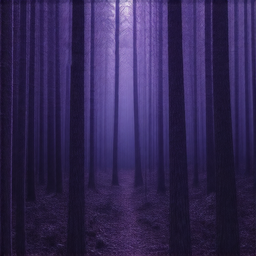

layer_difference=30
decoded text =  A
score=0.5578231334686279
svg length: 7309


  0%|          | 0/4 [00:00<?, ?it/s]

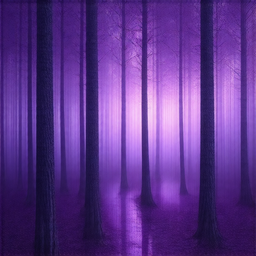

layer_difference=50
decoded text =  A
score=0.48075108528137206
svg length: 7798


  0%|          | 0/4 [00:00<?, ?it/s]

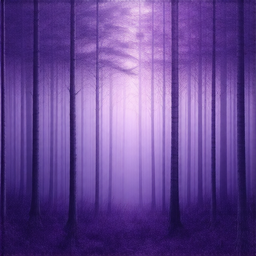

layer_difference=50
decoded text =  A
score=0.49390640258789065
svg length: 8066
final score: 0.5578231334686279
======= gray wool coat with a faux fur collar =======


  0%|          | 0/4 [00:00<?, ?it/s]

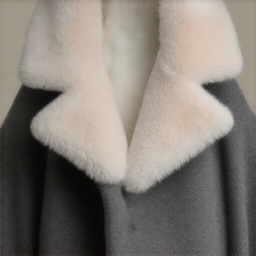

layer_difference=30
decoded text =  A
score=0.4344217777252197
svg length: 9215


  0%|          | 0/4 [00:00<?, ?it/s]

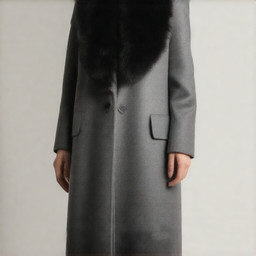

layer_difference=20
decoded text =  A
score=0.46053247451782225
svg length: 9712


  0%|          | 0/4 [00:00<?, ?it/s]

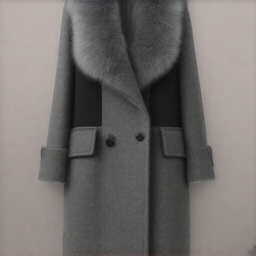

layer_difference=30
decoded text =  A
score=0.4499656200408936
svg length: 6707
final score: 0.46053247451782225
======= a lighthouse overlooking the ocean =======


  0%|          | 0/4 [00:00<?, ?it/s]

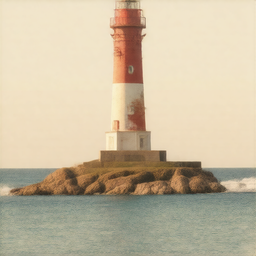

layer_difference=30
decoded text =  A
score=0.5188504695892334
svg length: 8310


  0%|          | 0/4 [00:00<?, ?it/s]

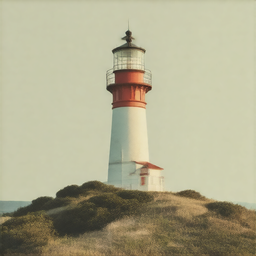

layer_difference=30
decoded text =  A
score=0.5167421817779541
svg length: 8215


  0%|          | 0/4 [00:00<?, ?it/s]

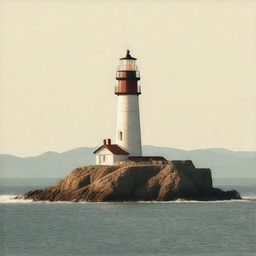

layer_difference=20
decoded text =  A
score=0.5200035572052002
svg length: 8302
final score: 0.5200035572052002
======= burgundy corduroy pants with patch pockets and silver buttons =======


  0%|          | 0/4 [00:00<?, ?it/s]

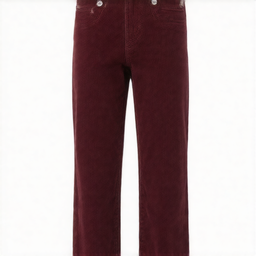

layer_difference=10
decoded text =  A
score=0.3761096477508545
svg length: 6201


  0%|          | 0/4 [00:00<?, ?it/s]

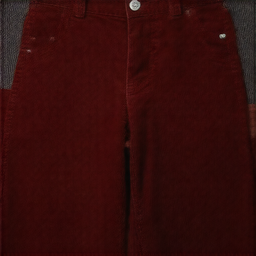

layer_difference=10
decoded text =  A
score=0.45781769752502444
svg length: 7459


  0%|          | 0/4 [00:00<?, ?it/s]

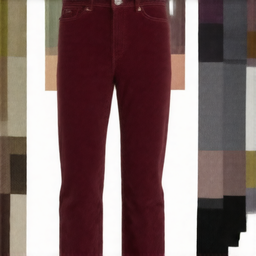

layer_difference=20
decoded text =  A
A
score=0.42130393981933595
svg length: 7499
final score: 0.45781769752502444
======= orange corduroy overalls =======


  0%|          | 0/4 [00:00<?, ?it/s]

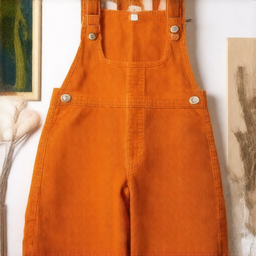

layer_difference=40
decoded text =  A
score=0.4354860305786133
svg length: 8614


  0%|          | 0/4 [00:00<?, ?it/s]

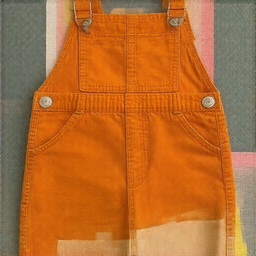

layer_difference=30
decoded text =  A
score=0.4264716148376465
svg length: 9172


  0%|          | 0/4 [00:00<?, ?it/s]

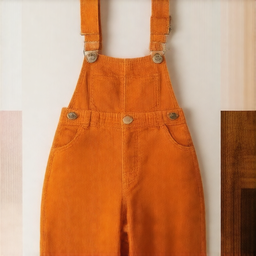

layer_difference=20
decoded text =  A
score=0.4261169910430908
svg length: 9683
final score: 0.4354860305786133
======= a purple silk scarf with tassel trim =======


  0%|          | 0/4 [00:00<?, ?it/s]

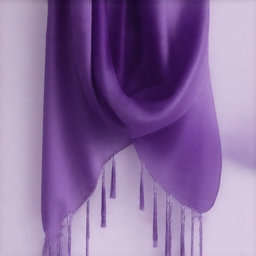

layer_difference=30
decoded text =  A
score=0.4486854553222656
svg length: 8570


  0%|          | 0/4 [00:00<?, ?it/s]

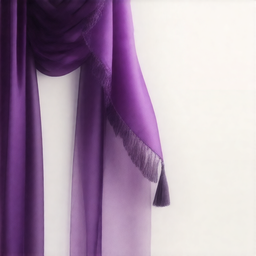

layer_difference=20
decoded text =  A
score=0.44041895866394043
svg length: 9894


  0%|          | 0/4 [00:00<?, ?it/s]

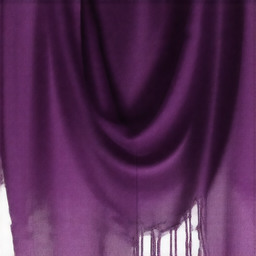

layer_difference=30
decoded text =  A
score=0.4546175003051758
svg length: 7024
final score: 0.4546175003051758
======= a green lagoon under a cloudy sky =======


  0%|          | 0/4 [00:00<?, ?it/s]

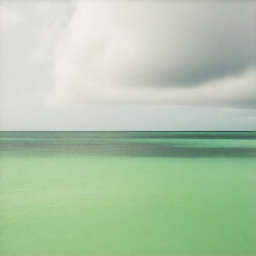

layer_difference=20
decoded text =  A
score=0.46781163215637206
svg length: 5759


  0%|          | 0/4 [00:00<?, ?it/s]

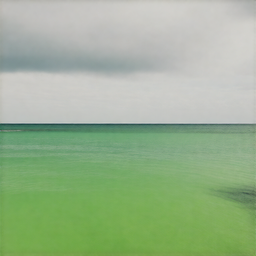

layer_difference=10
decoded text =  A
score=0.4414928436279297
svg length: 8855


  0%|          | 0/4 [00:00<?, ?it/s]

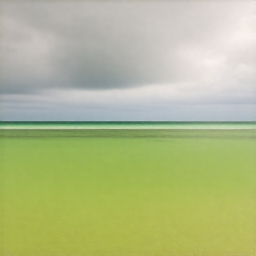

layer_difference=20
decoded text =  A
score=0.4704007148742676
svg length: 4921
final score: 0.4704007148742676
======= crimson rectangles forming a chaotic grid =======


  0%|          | 0/4 [00:00<?, ?it/s]

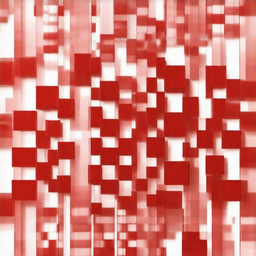

layer_difference=130
decoded text =  A
score=0.4567562580108643
svg length: 8716


  0%|          | 0/4 [00:00<?, ?it/s]

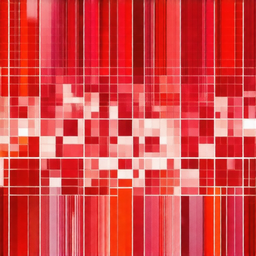

layer_difference=70
decoded text =  A
score=0.4187634468078613
svg length: 8954


  0%|          | 0/4 [00:00<?, ?it/s]

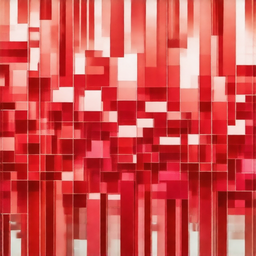

layer_difference=80
decoded text =  A
score=0.44919958114624026
svg length: 9927
final score: 0.4567562580108643
======= purple pyramids spiraling around a bronze cone =======


  0%|          | 0/4 [00:00<?, ?it/s]

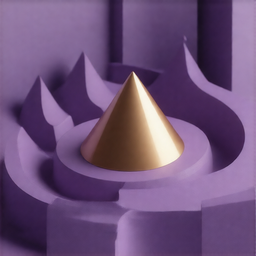

layer_difference=40
decoded text =  A
score=0.4855501174926758
svg length: 7557


  0%|          | 0/4 [00:00<?, ?it/s]

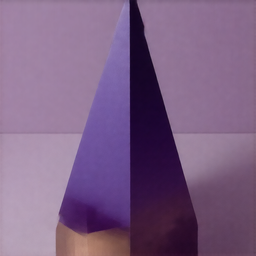

layer_difference=20
decoded text =  A
score=0.4689218521118164
svg length: 6306


  0%|          | 0/4 [00:00<?, ?it/s]

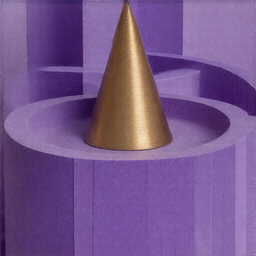

layer_difference=20
decoded text =  A
score=0.5052408218383789
svg length: 9897
final score: 0.5052408218383789
======= magenta trapezoids layered on a transluscent silver sheet =======


  0%|          | 0/4 [00:00<?, ?it/s]

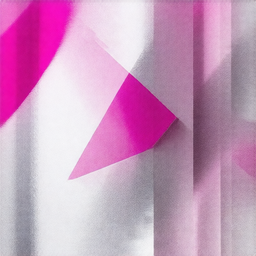

layer_difference=30
decoded text =  A
score=0.43560152053833007
svg length: 9186


  0%|          | 0/4 [00:00<?, ?it/s]

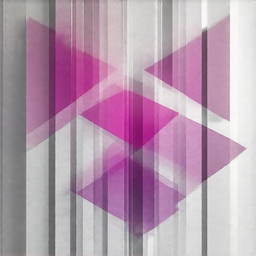

layer_difference=40
decoded text =  A
score=0.4366469860076904
svg length: 9689


  0%|          | 0/4 [00:00<?, ?it/s]

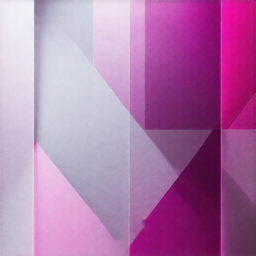

layer_difference=30
decoded text =  A
score=0.44876694679260254
svg length: 7226
final score: 0.44876694679260254
======= a snowy plain =======


  0%|          | 0/4 [00:00<?, ?it/s]

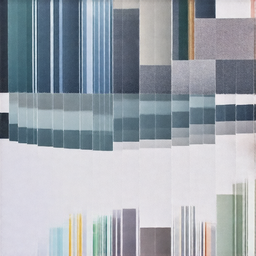

layer_difference=30
decoded text =  A
score=0.44089927673339846
svg length: 9697


  0%|          | 0/4 [00:00<?, ?it/s]

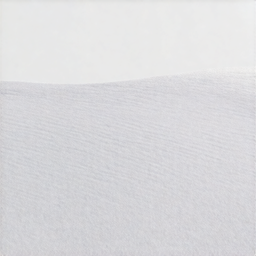

layer_difference=10
decoded text =  A
score=0.39580140113830564
svg length: 3146


  0%|          | 0/4 [00:00<?, ?it/s]

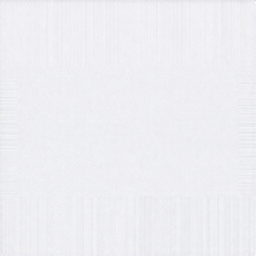

layer_difference=10
decoded text =  A
score=0.3900429725646973
svg length: 372
final score: 0.44089927673339846
======= black and white checkered pants =======


  0%|          | 0/4 [00:00<?, ?it/s]

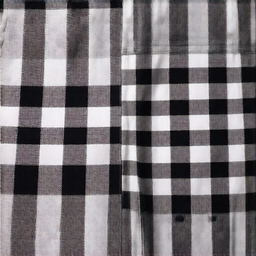

layer_difference=80
decoded text =  A
A
score=0.4159235954284668
svg length: 9469


  0%|          | 0/4 [00:00<?, ?it/s]

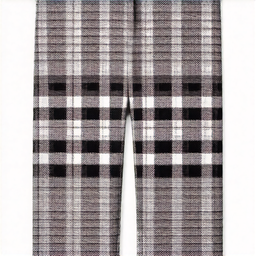

layer_difference=100
decoded text =  A
score=0.3885222911834717
svg length: 9223


  0%|          | 0/4 [00:00<?, ?it/s]

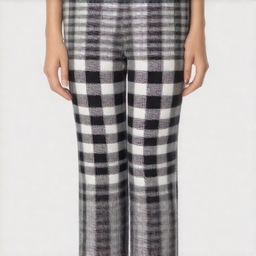

layer_difference=70
decoded text =  A
score=0.42662920951843264
svg length: 9907
final score: 0.42662920951843264
======= a starlit night over snow-covered peaks =======


  0%|          | 0/4 [00:00<?, ?it/s]

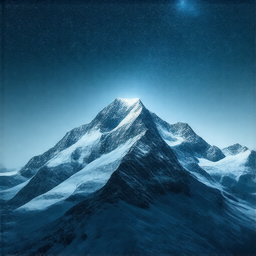

layer_difference=60
decoded text =  A
score=0.529293155670166
svg length: 8950


  0%|          | 0/4 [00:00<?, ?it/s]

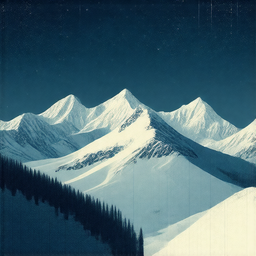

layer_difference=40
decoded text =  A
A
score=0.5639402389526367
svg length: 8926


  0%|          | 0/4 [00:00<?, ?it/s]

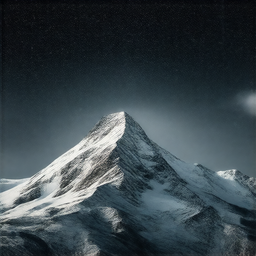

layer_difference=60
decoded text =  A
A
score=0.45201997756958007
svg length: 9232
final score: 0.5639402389526367
======= khaki triangles and azure crescents =======


  0%|          | 0/4 [00:00<?, ?it/s]

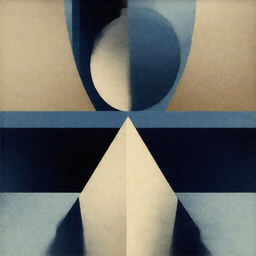

layer_difference=40
decoded text =  A
score=0.5110323905944825
svg length: 7075


  0%|          | 0/4 [00:00<?, ?it/s]

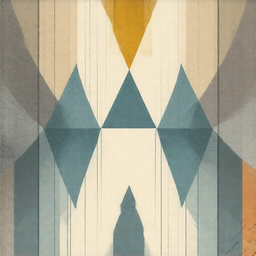

layer_difference=30
decoded text =  A
score=0.4789902210235596
svg length: 6707


  0%|          | 0/4 [00:00<?, ?it/s]

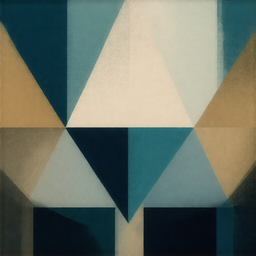

layer_difference=20
decoded text =  A
A
score=0.503696060180664
svg length: 8213
final score: 0.5110323905944825
======= a maroon dodecahedron interwoven with teal threads =======


  0%|          | 0/4 [00:00<?, ?it/s]

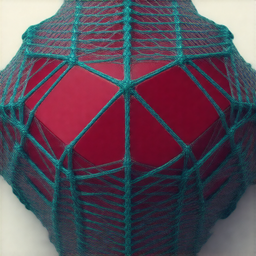

layer_difference=60
decoded text =  A
score=0.4986851215362549
svg length: 7607


  0%|          | 0/4 [00:00<?, ?it/s]

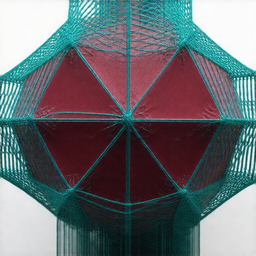

layer_difference=40
decoded text =  A
score=0.46370935440063477
svg length: 8822


  0%|          | 0/4 [00:00<?, ?it/s]

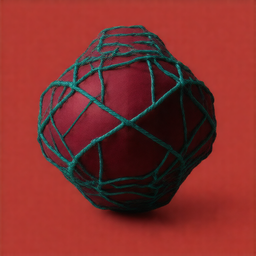

layer_difference=30
decoded text =  A
score=0.4813069820404053
svg length: 8966
final score: 0.4986851215362549
CPU times: total: 5min 55s
Wall time: 12min 28s


In [ ]:
%%time
train_df['raw_res'] = train_df.description.progress_apply(model.predict_impl)

In [ ]:
train_df['svg'] = train_df.raw_res.apply(lambda x: x[0])
train_df['bitmap'] = train_df.raw_res.apply(lambda x: x[1])

In [ ]:
train_df['bitmap_score'] = train_df.progress_apply(
    lambda r: bitmap_score_instance(r.multiple_choice_qa, r.bitmap, random_seed=42),
    axis=1,
)

  0%|          | 0/15 [00:00<?, ?it/s]

decoded text =  © Getty Images
decoded text =  1
decoded text =  1
decoded text =  10
decoded text =  L
decoded text =  PhotoRoom®
decoded text =  © Simon Bell
decoded text =  © Getty Images
decoded text =  1
decoded text =  PAPERS.co
decoded text =  1
decoded text =  D
decoded text =  © Getty Images
decoded text =  © ArtNow.ru
decoded text =  ©2016


In [ ]:
train_df['svg_score'] = train_df.progress_apply(
    lambda r: metric.score_instance(r.multiple_choice_qa, r.svg, random_seed=42),
    axis=1,
)

  0%|          | 0/15 [00:00<?, ?it/s]

decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A


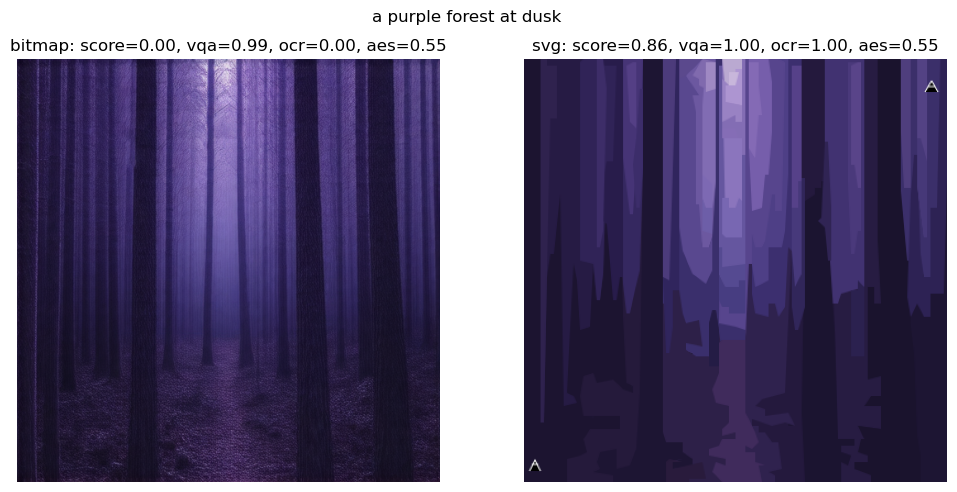

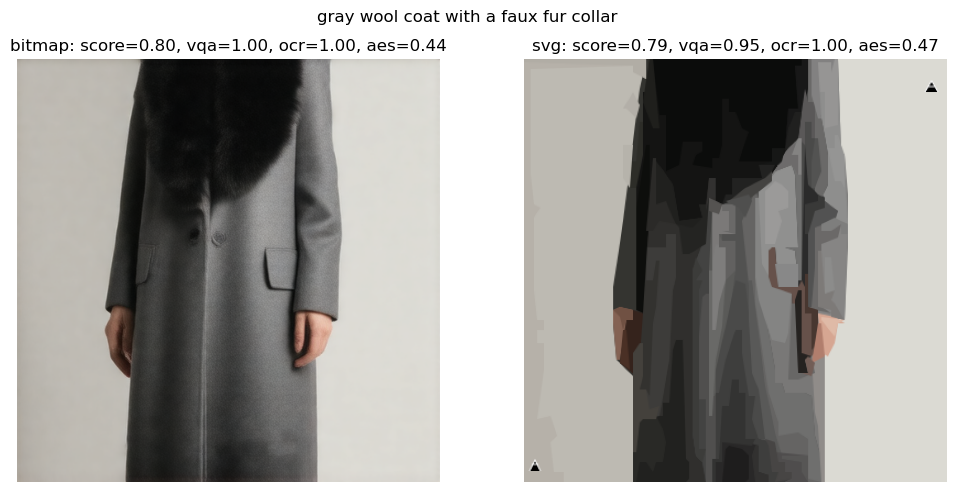

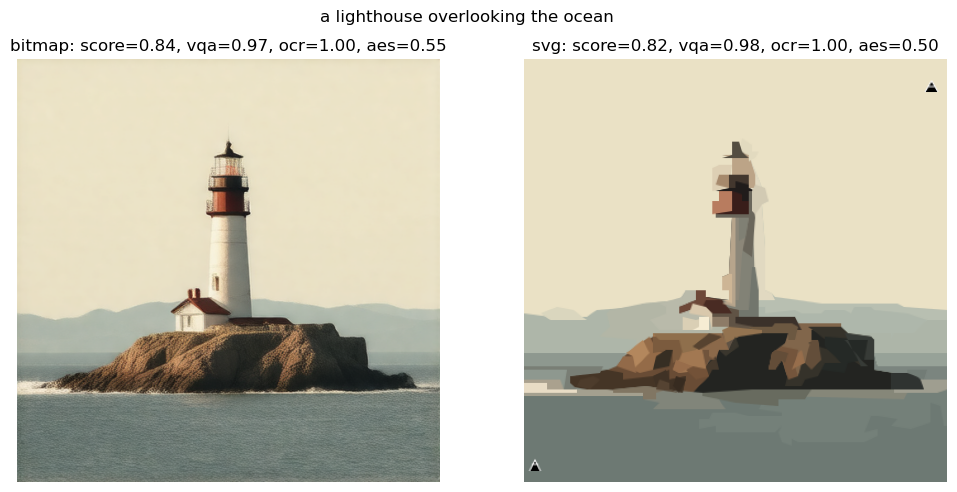

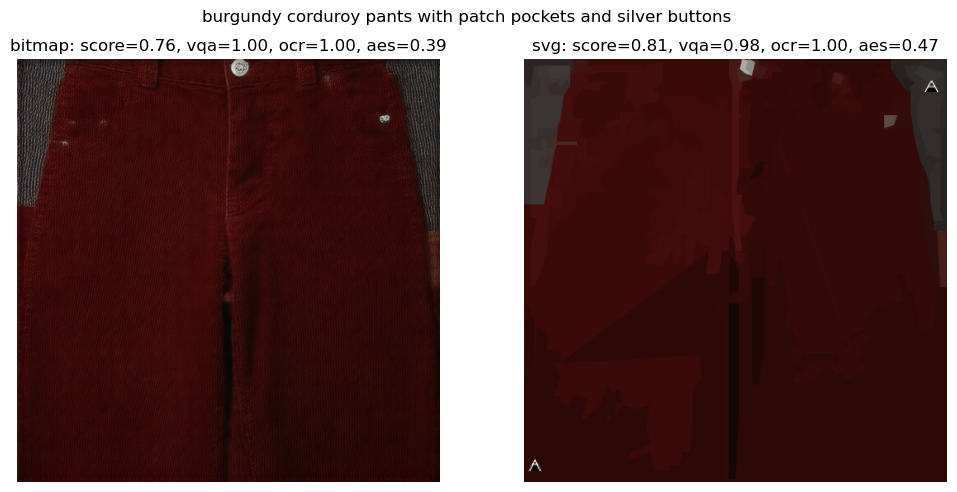

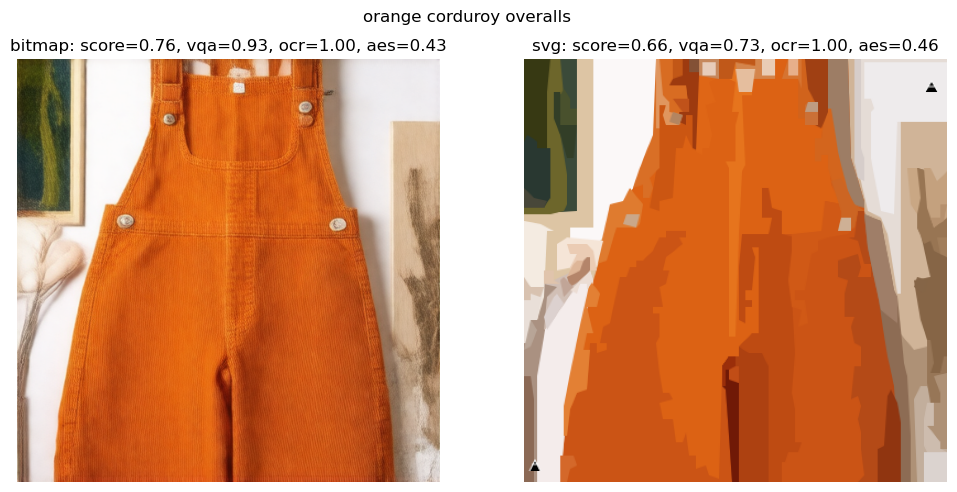

...

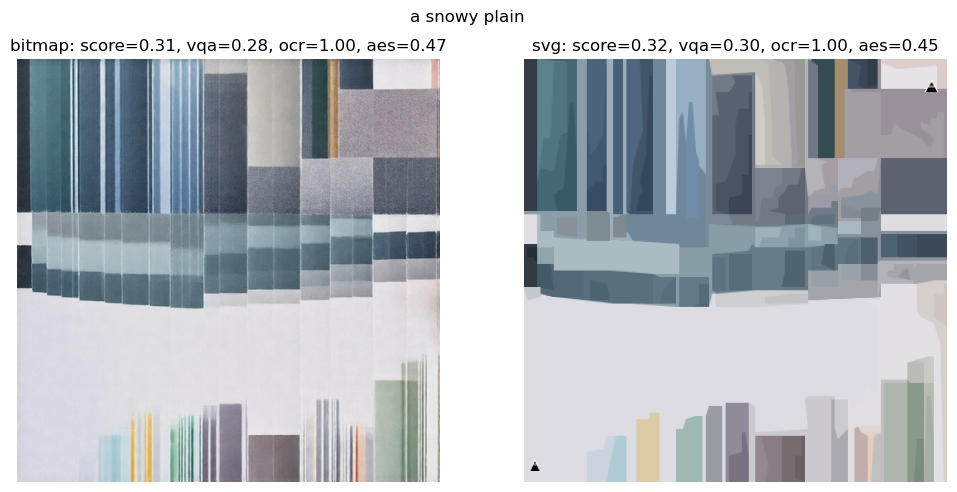

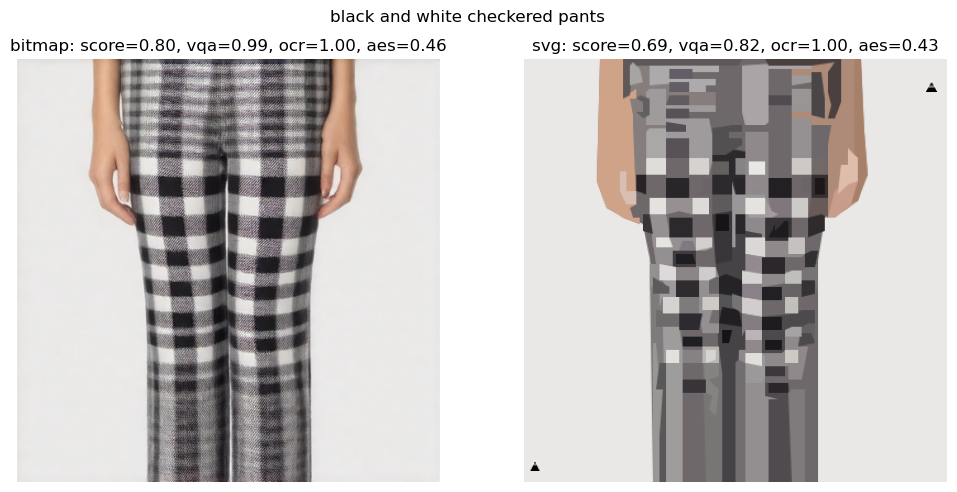

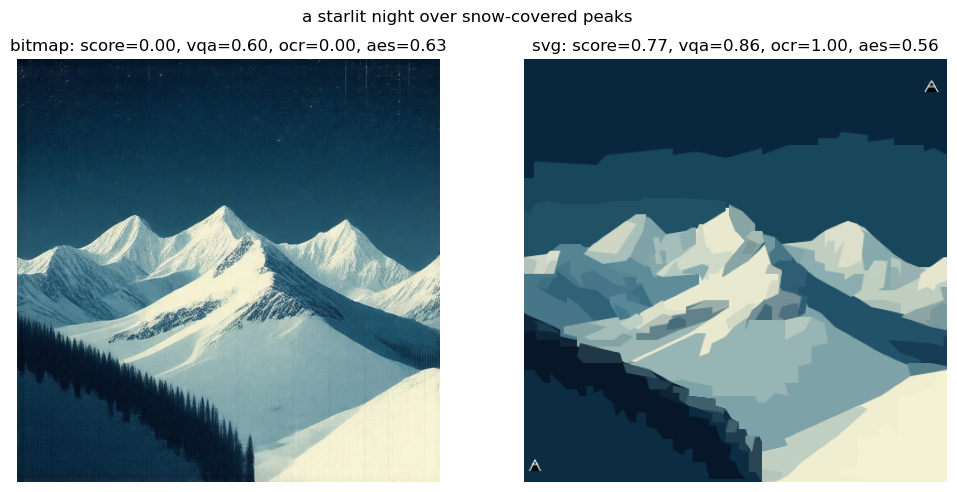

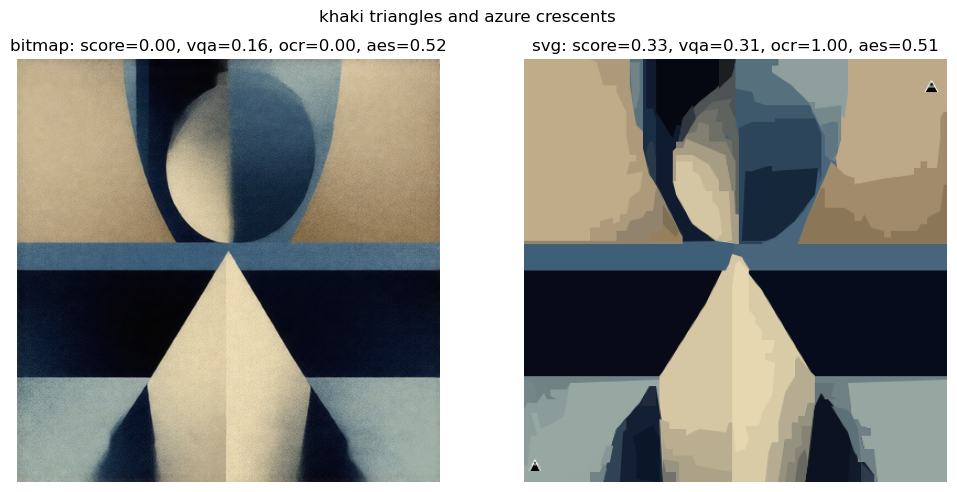

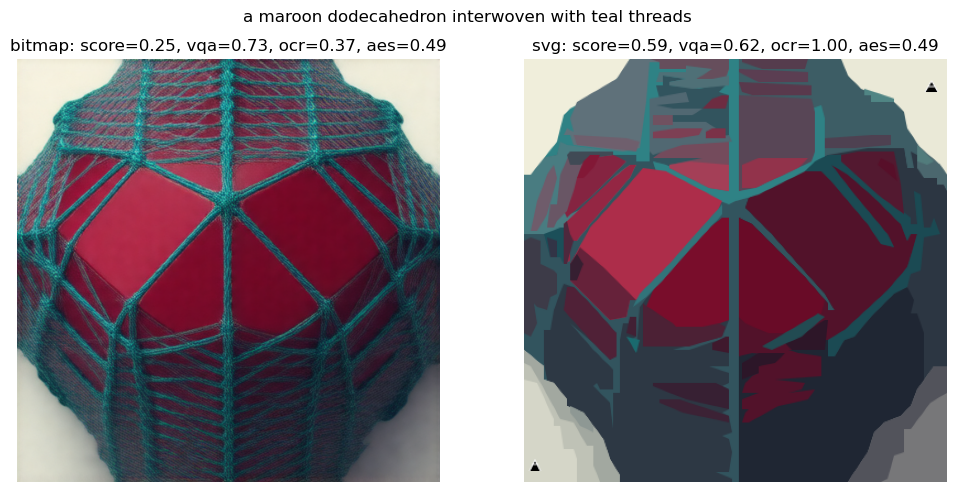

In [ ]:
for r in train_df.itertuples():
    
    b_vqa = r.bitmap_score['vqa_score']
    b_aesthetic = r.bitmap_score['aesthetic_score']
    b_ocr = r.bitmap_score['ocr_score']
    b_score = r.bitmap_score['competition_score']

    
    s_vqa = r.svg_score['vqa_score']
    s_aesthetic = r.svg_score['aesthetic_score']
    s_ocr = r.svg_score['ocr_score']
    s_score = r.svg_score['competition_score']
    
    plt.figure(figsize=(12, 6))
    plt.suptitle(r.description, y=0.93)
    
    plt.subplot(1, 2, 1)
    plt.imshow(np.array(r.bitmap))
    plt.axis('off')
    plt.title(f'bitmap: score={b_score:.2f}, vqa={b_vqa:.2f}, ocr={b_ocr:.2f}, aes={b_aesthetic:.2f}')

    plt.subplot(1, 2, 2)
    plt.imshow(metric.svg_to_png(r.svg))
    plt.axis('off')
    plt.title(f'svg: score={s_score:.2f}, vqa={s_vqa:.2f}, ocr={s_ocr:.2f}, aes={s_aesthetic:.2f}')

In [ ]:
mean_bitmap_score = pd.DataFrame(train_df['bitmap_score'].tolist()).mean(axis=0)
mean_bitmap_score

competition_score    0.335315
vqa_score            0.711210
ocr_score            0.491899
aesthetic_score      0.487416
dtype: float64

In [ ]:
mean_svg_score = pd.DataFrame(train_df['svg_score'].tolist()).mean(axis=0)
mean_svg_score

competition_score    0.623603
vqa_score            0.690115
ocr_score            1.000000
aesthetic_score      0.486242
dtype: float64

In [ ]:
print(f'Original bitmap score: {mean_bitmap_score.competition_score}')
print(f'Final svg score: {mean_svg_score.competition_score}')

Original bitmap score: 0.3353154362806377
Final svg score: 0.6236027972904644
